#Student Attention  
The project idea is to measures the student attention in online virtual classes,
so we worked on 2 models one for detecting Side face if the student not foucsed it will make an alert sound using dlib and the other model is to detect student engagment(foucesd, not foucsed) based on student emotins[Focused,Frustrated, Looking away, Sleepy, confused, Bored Focused]using YOLO

The first model :
the requaerd things to do is to take to download the file of predector(https://github.com/italojs/facial-landmarks-recognition/blob/master/shape_predictor_68_face_landmarks.dat)

we experiment our model using webcam you can take the code and try it on jupyter notebook

installing the dlib

In [ ]:
!pip install cmake

In [ ]:
!pip install dlib

In [ ]:
!pip install pyttsx3

In [ ]:
!pip install pygame

In [ ]:
#Import nessessory library
import cv2
import dlib
import numpy as np
import pygame
import time

# Function to calculate the position of the face based on facial landmarks
def calculate_face(face_landmarks):
    #This line of code means calculate the average position of the left eye.
    left_eye = np.mean([(landmarks.part(n).x, landmarks.part(n).y) for n in range(36, 42)], axis=0)
    #This line of code means calculate the average position of the right eye.
    right_eye = np.mean([(landmarks.part(n).x, landmarks.part(n).y) for n in range(42, 48)], axis=0)
    if left_eye[0] < right_eye[0]:#x-coordinate of the left eye is less than the x-coordinate of the right eye.
        #If this condition is true, it means that the left eye is positioned to the left of the right eye.
        return "left"
    else:
        return "right"

#This function for play sound which we will attach in the next codes
def play_sound(filename):
    pygame.mixer.init()
    pygame.mixer.music.load(filename)
    pygame.mixer.music.play()

cap = cv2.VideoCapture(0)#OpenCV used to capture video from cameras

#These lines of code initialize the face detector and shape predictor objects using the dlib library.
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('C:/Users/RAZAN/Downloads/shape_predictor_68_face_landmarks.dat')

# Threshold for the duration of face presence in seconds
start_time = None
face_duration_threshold = 10  # in seconds

while True:
    _, frame = cap.read()# Read a frame from the camera
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)#Convert frame to grayscale
    faces = detector(gray)#faces in the grayscale frame

    for face in faces:
    # Get the coordinates of the bounding box around the face
        x1 = face.left()
        y1 = face.top()
        x2 = face.right()
        y2 = face.bottom()
    # Draw a rectangle around the face
        cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 3)
    #Predict landmarks face
        landmarks = predictor(gray, face)
    #Calculate face positions 'Left' 'Right' based on eyes
        face_position = calculate_face(landmarks)
    #Extract the landmarks representing the face
        face_landmarks = [(landmarks.part(n).x, landmarks.part(n).y) for n in range(1, 17)]
    #Calculate face positions 'Left' 'Right' based on face landmarks
        face_side = calculate_face(face_landmarks)

        # If the face has been in the detected position for longer than the threshold, play a sound
        if face_side == "left" or face_side == "right":
            if start_time is None:
                start_time = time.time()
        else:
            elapsed_time = time.time() - start_time
        if elapsed_time > face_duration_threshold:
            play_sound("C:/Users/RAZAN/Downloads/mixkit-interface-hint-notification-911.wav")



    cv2.imshow("Frame", frame)# Display the frame

    key = cv2.waitKey(1)
    if key == 27:
        break# Press 'esc' for a seconds to exit the loop

cap.release()# Release the video capture
cv2.destroyAllWindows()# Close all OpenCV windows

#The second model :
## The dataset is collected and annoteted from Roboflow and triand with YOLO

## Installation

In [ ]:
!conda install pytorch torchvision cudatoolkit=11.3 -c pytorch

/bin/bash: line 1: conda: command not found


Clone yolov5 repository from ultralytics

In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16413, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 16413 (delta 0), reused 3 (delta 0), pack-reused 16408
Receiving objects: 100% (16413/16413), 14.95 MiB | 14.16 MiB/s, done.
Resolving deltas: 100% (11260/11260), done.
/content/yolov5


Install requirements:

In [ ]:
%pip install -qr requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 715.4/715.4 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.6 MB/s eta 0:00:00


## Data Handeling
**importing** the API key of roboflow that contain the annoteted dataset

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Cg77CEC817P2y8sONGW0")
project = rf.workspace("master-1r31c").project("emotion-h2nzk")
dataset = project.version(1).download("yolov8")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.1 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing installation: cycler 0

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.1.16, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Emotion-1 in yolov8:: 100%|██████████| 486/486 [00:00<00:00, 8497.11it/s]


This is the content of Emotion-1

In [ ]:
!cat /content/yolov5/Emotion-1/data.yaml
print ('---------------------------------------------')

names:
- Bored
- Focused
- Frustrated
- Looking away
- SLEP
- Sleepy
- confused
nc: 7
roboflow:
  license: CC BY 4.0
  project: emotion-h2nzk
  url: https://universe.roboflow.com/master-1r31c/emotion-h2nzk/dataset/1
  version: 1
  workspace: master-1r31c
test: ../test/images
train: Emotion-1/train/images
val: Emotion-1/valid/images
---------------------------------------------


#Training
##Feature extraction

In [ ]:
from IPython.display import clear_output

!python train.py --batch 32 --epochs 150 --data '/content/yolov5/Emotion-1/data.yaml' --weights 'yolov5s6.pt' --project 'DetectSystem' --name 'Detect_System' --cache --freeze 12

2024-02-21 10:25:37.782836: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-21 10:25:37.782902: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-21 10:25:37.784316: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s6.pt, cfg=, data=/content/yolov5/Emotion-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=Fal

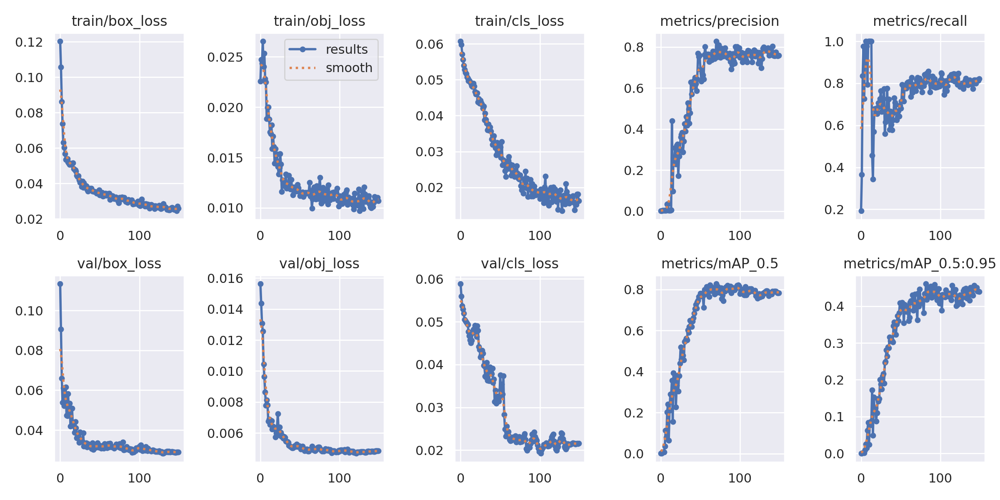

In [ ]:
from IPython.display import Image, display

display(Image(filename="/content/yolov5/DetectSystem/Detect_System/results.png"))

#Fine Tuning

In [ ]:
!python train.py --hyp '/content/yolov5/DetectSystem/Detect_System/hyp.yaml' --batch 16 --epochs 100 --data '/content/yolov5/Emotion-1/data.yaml' --weights '/content/yolov5/DetectSystem/Detect_System/weights/best.pt' --project 'DetectSystem' --name 'fine-tuning' --cache

2024-02-21 10:36:13.530858: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-21 10:36:13.530912: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-21 10:36:13.532943: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=/content/yolov5/DetectSystem/Detect_System/weights/best.pt, cfg=, data=/content/yolov5/Emotion-1/data.yaml, hyp=/content/yolov5/DetectSystem/Detect_System/hyp.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=Non

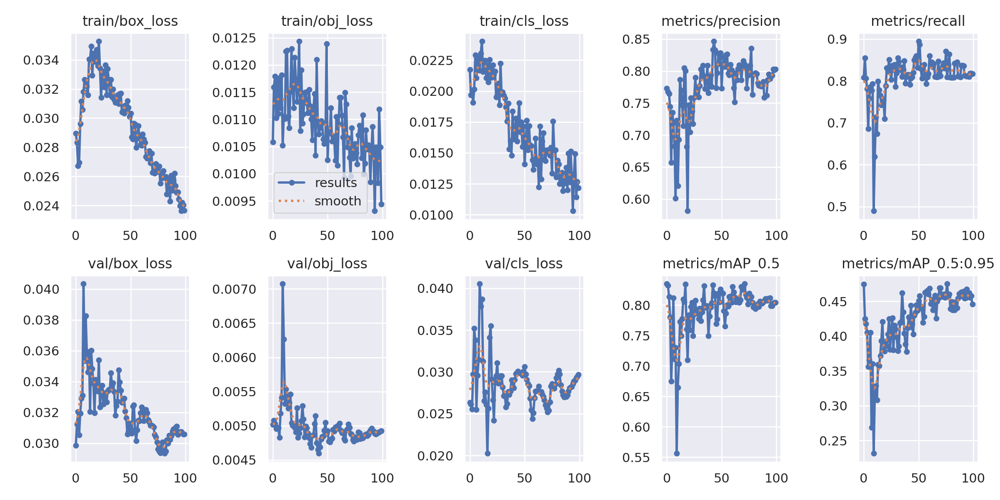

In [ ]:
display(Image(filename="/content/yolov5/DetectSystem/fine-tuning/results.png"))

#Validation

In [ ]:
!python val.py --weights '/content/yolov5/DetectSystem/fine-tuning/weights/best.pt' --batch 64 --data '/content/yolov5/Emotion-1/data.yaml' --task test --project 'DetectSystem' --name 'validation_on_test_data' --augment

val: data=/content/yolov5/Emotion-1/data.yaml, weights=['/content/yolov5/DetectSystem/fine-tuning/weights/best.pt'], batch_size=64, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=True, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=DetectSystem, name=validation_on_test_data, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-284-g95ebf68f Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 206 layers, 12331312 parameters, 0 gradients, 16.2 GFLOPs
test: Scanning /content/yolov5/Emotion-1/test/labels... 24 images, 0 backgrounds, 0 corrupt: 100% 24/24 [00:00<00:00, 400.16it/s]
test: New cache created: /content/yolov5/Emotion-1/test/labels.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 1/1 [00:02<00:00,  2.06s/it]
                   all         24         24      0.794      0.836    

#Plot Precision Recall curve:

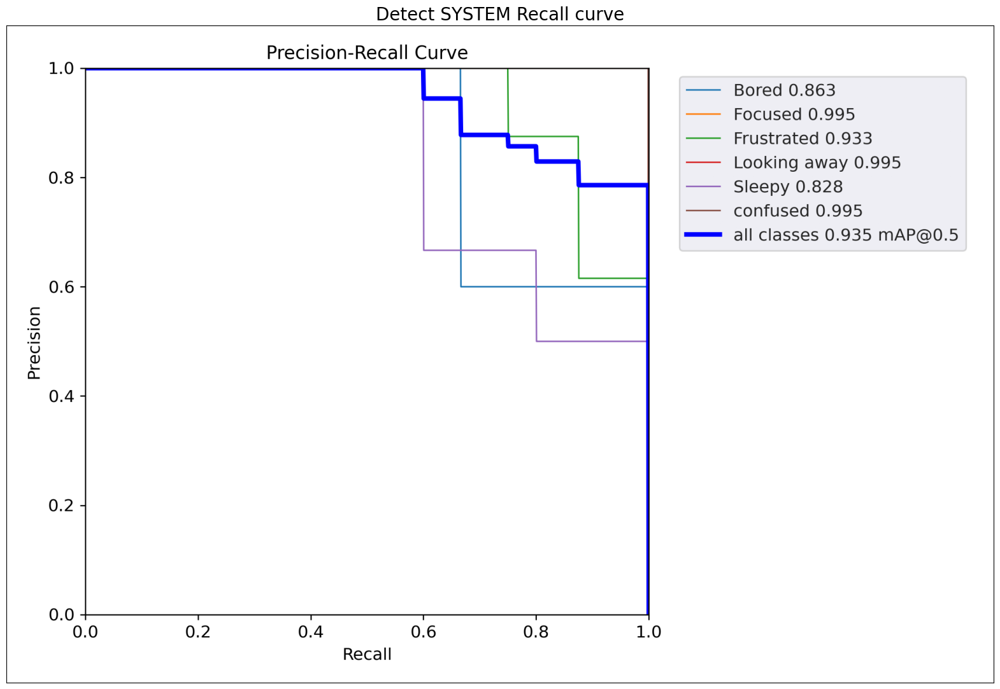

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

plt.figure(figsize=(20,20))
plt.title('Detect SYSTEM Recall curve', fontsize=20)
plt.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
plt.imshow(mpimg.imread('/content/yolov5/DetectSystem/validation_on_test_data2/PR_curve.png'))

#Inference

In [ ]:
!python detect.py --weights '/content/yolov5/DetectSystem/fine-tuning/weights/best.pt'  --conf 0.6 --source '/content/yolov5/Emotion-1/test/images' --project 'DetectSystem' --name 'detect_test' --augment --line=3

detect: weights=['/content/yolov5/DetectSystem/fine-tuning/weights/best.pt'], source=/content/yolov5/Emotion-1/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.6, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=True, visualize=False, update=False, project=DetectSystem, name=detect_test, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-284-g95ebf68f Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 206 layers, 12331312 parameters, 0 gradients, 16.2 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/24 /content/yolov5/Emotion-1/test/images/Bored-044_jpg.rf.65b93a8386284650103467daf2c27751.jpg: 640x640 1 Sleepy, 249.8ms
image 2/24 /content/yolov5/Emotion-1/test/images/Bored-078_jpg.rf.aeb6c007a7a7f72e0d7f6b0949d774ce.jpg: 6

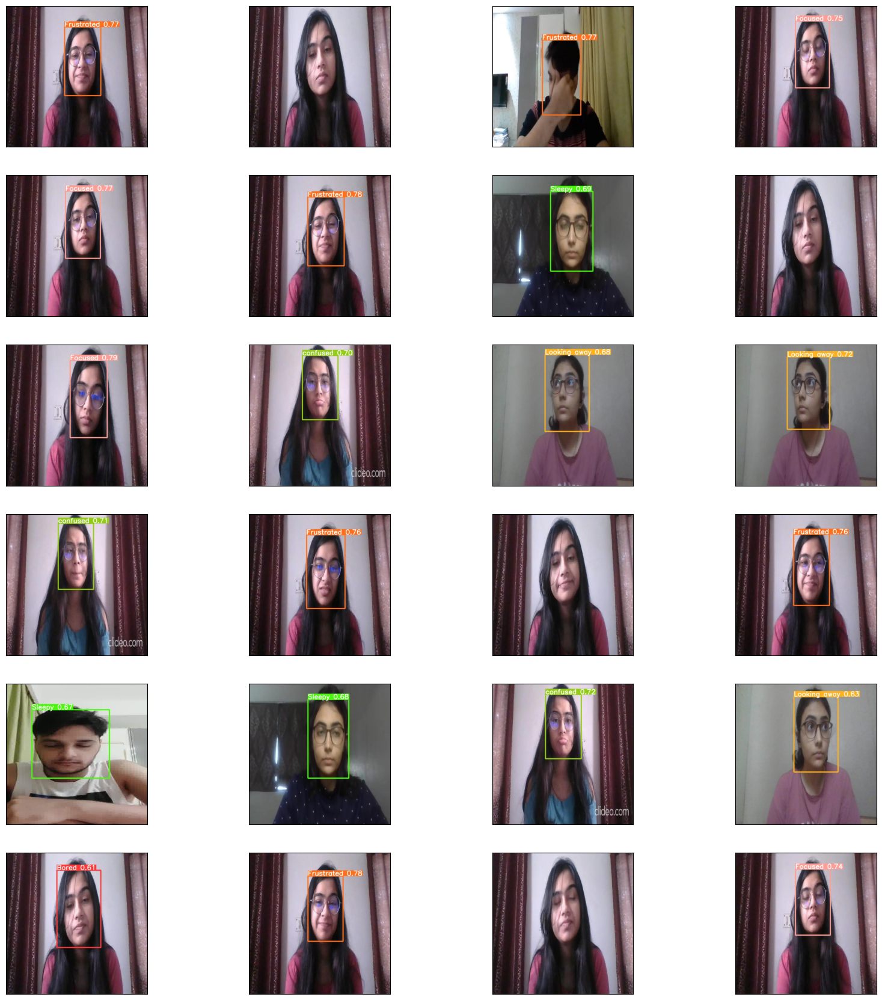

In [ ]:
import glob
detect_path = r'/content/yolov5/DetectSystem/detect_test'

images = []
for img_path in glob.glob(detect_path + '/*.jpg'):
    images.append(mpimg.imread(img_path))

plt.figure(figsize=(20,25))
columns = 4
for i, image in enumerate(images):
    plt.subplot((int(len(images) / columns + 1)), columns, i + 1)
    plt.tick_params(left = False, right = False , labelleft = False, labelbottom = False, bottom = False)
    plt.imshow(image)

In [ ]:
import cv2
import torch
from IPython.display import display, FileLink

import torch

# Specify the path to your custom model's weights file
model_path = '/content/yolov5/DetectSystem/fine-tuning/weights/best.pt'

# Load your custom YOLOv5 model
model = torch.hub.load('/content/yolov5', 'custom', path=model_path, source='local')


# Open the video file
cap = cv2.VideoCapture('/content/VideoClassroom.mp4')

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('/content/video_with_detections.avi', fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))

while True:
    ret, frame = cap.read()
    if not ret:
        break

    # Convert the frame to the format expected by YOLOv5
    results = model(frame)

    # Render the results on the frame
    frame_with_detections = results.render()[0]

    # Write frame to output video
    out.write(frame_with_detections)

# Release resources
cap.release()
out.release()
#cv2.destroyAllWindows()

# Display a link to download the processed video
display(FileLink('/content/video_with_detections.avi'))


YOLOv5 🚀 2024-2-21 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 206 layers, 12331312 parameters, 0 gradients, 16.2 GFLOPs
Adding AutoShape... 


/content/video_with_detections.avi

In [ ]:
!ffmpeg -i /content/video_with_detections.avi -vcodec libx264 /content/video_with_detections.mp4


ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
from IPython.display import HTML
from base64 import b64encode

video_path = '/content/video_with_detections.mp4'

# Embed the video in the notebook
mp4 = open(video_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=400 controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")